<a href="https://www.kaggle.com/code/victorfsc/brazil-wildfires-eda-w-geopandas-regression?scriptVersionId=160276685" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

## About the data and forest fires

- The data used here is about forest fires in Brazil from 1998 to 2017.

- I also did made a dashboard in Tableau using this dataset, with interesting visualizations: 
https://public.tableau.com/app/profile/victor.foscarini.almeida3130/viz/forest_fires_brazil/Dashboard1

- Check out some of my other projects on GitHub:
https://github.com/Victor-Foscarini

In [1]:
%%HTML
<div class='tableauPlaceholder' id='viz1638280736164' style='position: relative'><noscript><a href='#'><img alt='Dashboard 1 ' src='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;fo&#47;forest_fires_brazil&#47;Dashboard1&#47;1_rss.png' style='border: none' /></a></noscript><object class='tableauViz'  style='display:none;'><param name='host_url' value='https%3A%2F%2Fpublic.tableau.com%2F' /> <param name='embed_code_version' value='3' /> <param name='site_root' value='' /><param name='name' value='forest_fires_brazil&#47;Dashboard1' /><param name='tabs' value='no' /><param name='toolbar' value='yes' /><param name='static_image' value='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;fo&#47;forest_fires_brazil&#47;Dashboard1&#47;1.png' /> <param name='animate_transition' value='yes' /><param name='display_static_image' value='yes' /><param name='display_spinner' value='yes' /><param name='display_overlay' value='yes' /><param name='display_count' value='yes' /><param name='language' value='pt-BR' /></object></div>                <script type='text/javascript'>                    var divElement = document.getElementById('viz1638280736164');                    var vizElement = divElement.getElementsByTagName('object')[0];                    if ( divElement.offsetWidth > 800 ) { vizElement.style.width='1200px';vizElement.style.height='927px';} else if ( divElement.offsetWidth > 500 ) { vizElement.style.width='1200px';vizElement.style.height='927px';} else { vizElement.style.width='100%';vizElement.style.height='1177px';}                     var scriptElement = document.createElement('script');                    scriptElement.src = 'https://public.tableau.com/javascripts/api/viz_v1.js';                    vizElement.parentNode.insertBefore(scriptElement, vizElement);                </script>

## 1 - Getting data and importing libraries

In [2]:
#importing libraries

#basics
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np
import seaborn as sns
from mpl_toolkits.mplot3d import axes3d
from IPython.display import display, HTML

#stats
import math, time, random, datetime
from pandas_profiling import ProfileReport

#visualizing missing values
import missingno as msno

#processing data
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, label_binarize

#spliting and testing data
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict, StratifiedKFold, GridSearchCV
from sklearn import metrics, model_selection, tree, preprocessing, linear_model
from sklearn.metrics import accuracy_score

#plt params
params = {'figure.figsize':(12,6),
          'font.size':15,
          'axes.titlesize':'large'}
plt.rcParams.update(params)

#colors
PURPLE = '\033[95m'
CYAN = '\033[96m'
DARKCYAN = '\033[36m'
BLUE = '\033[94m'
GREEN = '\033[92m'
YELLOW = '\033[93m'
RED = '\033[91m'
BOLD = '\033[1m'
UNDERLINE = '\033[4m'
END = '\033[0m'

In [3]:
#reading
df = pd.read_csv('../input/forest-fires-in-brazil/amazon.csv', encoding='latin1')

#grouping data by year, state, month
df = df.groupby(by = ['year','state','month']).sum().reset_index()
df

,year,state,month,number
0,1998,Acre,Abril,0.000
1,1998,Acre,Agosto,130.000
2,1998,Acre,Dezembro,7.000
3,1998,Acre,Fevereiro,0.000
4,1998,Acre,Janeiro,0.000
...,...,...,...,...
5492,2017,Tocantins,Maio,576.000
5493,2017,Tocantins,Março,98.000
5494,2017,Tocantins,Novembro,434.000
5495,2017,Tocantins,Outubro,2.969


In [4]:
#basic info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5497 entries, 0 to 5496
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   year    5497 non-null   int64  
 1   state   5497 non-null   object 
 2   month   5497 non-null   object 
 3   number  5497 non-null   float64
dtypes: float64(1), int64(1), object(2)
memory usage: 171.9+ KB


In [5]:
#the data has no null values
df.isna().sum()

year      0
state     0
month     0
number    0
dtype: int64

## 2 - Exploratory Data Analysis

### Visualizing Brazil map using fiona and geopandas

In [6]:
#the gpkg file has multiple layers, we want states
import fiona
fiona.listlayers('../input/geopandasbrazil/gadm36_BRA.gpkg')

['gadm36_BRA_0', 'gadm36_BRA_1', 'gadm36_BRA_2', 'gadm36_BRA_3']

In [7]:
#using geopandas
import geopandas as gpd
br = gpd.read_file('../input/geopandasbrazil/gadm36_BRA.gpkg',layer='gadm36_BRA_1')
br.columns

Index(['GID_0', 'NAME_0', 'GID_1', 'NAME_1', 'VARNAME_1', 'NL_NAME_1',
       'TYPE_1', 'ENGTYPE_1', 'CC_1', 'HASC_1', 'geometry'],
      dtype='object')

In [8]:
#column NAME_1 contains the name of all states
br.NAME_1

0                    Acre
1                 Alagoas
2                   Amapá
3                Amazonas
4                   Bahia
5                   Ceará
6        Distrito Federal
7          Espírito Santo
8                   Goiás
9                Maranhão
10            Mato Grosso
11     Mato Grosso do Sul
12           Minas Gerais
13                   Pará
14                Paraíba
15                 Paraná
16             Pernambuco
17                  Piauí
18         Rio de Janeiro
19    Rio Grande do Norte
20      Rio Grande do Sul
21               Rondônia
22                Roraima
23         Santa Catarina
24              São Paulo
25                Sergipe
26              Tocantins
Name: NAME_1, dtype: object

Acre


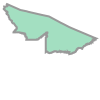

Alagoas


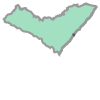

Amapá


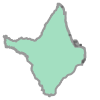

Amazonas


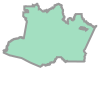

Bahia


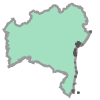

Ceará


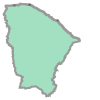

Distrito Federal


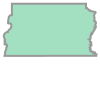

Espírito Santo


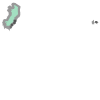

Goiás


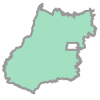

Maranhão


Mato Grosso


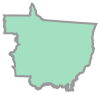

Mato Grosso do Sul


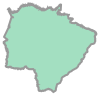

Minas Gerais


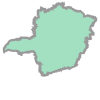

Pará


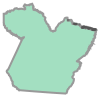

Paraíba


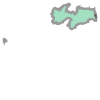

Paraná


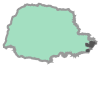

Pernambuco


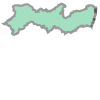

Piauí


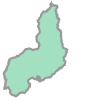

Rio de Janeiro


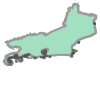

Rio Grande do Norte


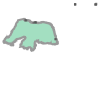

Rio Grande do Sul


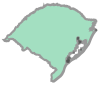

Rondônia


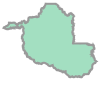

Roraima


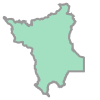

Santa Catarina


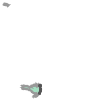

São Paulo


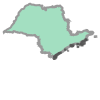

Sergipe


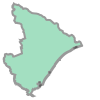

In [9]:
#visualizing the geometry of each state
for i in range(26):
    print(br.NAME_1[i])
    display(br.geometry[i])

<AxesSubplot:>

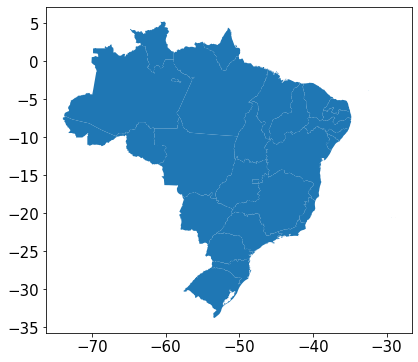

In [10]:
#now seeing the whole map
br.plot()

In [11]:
#comparing tha state nomes on the data set with the state names in the geopandas file
br.NAME_1.values,np.unique(df.state)

(array(['Acre', 'Alagoas', 'Amapá', 'Amazonas', 'Bahia', 'Ceará',
        'Distrito Federal', 'Espírito Santo', 'Goiás', 'Maranhão',
        'Mato Grosso', 'Mato Grosso do Sul', 'Minas Gerais', 'Pará',
        'Paraíba', 'Paraná', 'Pernambuco', 'Piauí', 'Rio de Janeiro',
        'Rio Grande do Norte', 'Rio Grande do Sul', 'Rondônia', 'Roraima',
        'Santa Catarina', 'São Paulo', 'Sergipe', 'Tocantins'],
       dtype=object),
 array(['Acre', 'Alagoas', 'Amapa', 'Amazonas', 'Bahia', 'Ceara',
        'Distrito Federal', 'Espirito Santo', 'Goias', 'Maranhao',
        'Mato Grosso', 'Minas Gerais', 'Paraiba', 'Pará', 'Pernambuco',
        'Piau', 'Rio', 'Rondonia', 'Roraima', 'Santa Catarina',
        'Sao Paulo', 'Sergipe', 'Tocantins'], dtype=object))

In [12]:
#some states listed in the geopandas files don't appear in the dataset
df[df.state=='Mato Grosso do Sul']

,year,state,month,number


In [13]:
#some states have wrong names, we'll have to replace them with right name
df_states = sorted(np.unique(df.state))
states = br.NAME_1.values

#delete states with no data
states = np.delete(states,np.argwhere(states=='Mato Grosso do Sul'))
states = np.delete(states,np.argwhere(states=='Paraná'))
states = np.delete(states,np.argwhere(states=='Rio Grande do Norte'))
states = np.delete(states,np.argwhere(states=='Rio Grande do Sul'))

#change paraíba and pará because error messed up order
def swap_states(states,df_states,state1,state2):
    states = np.where(states==state1,'transition',states)
    states = np.where(states==state2,state1,states)
    states = np.where(states=='transition',state2,states)
    return states

#dict to replace state names
states = swap_states(states,df_states,'Pará','Paraíba')
states = {df_state:state for df_state,state in zip(df_states,states)}
states

{'Acre': 'Acre',
 'Alagoas': 'Alagoas',
 'Amapa': 'Amapá',
 'Amazonas': 'Amazonas',
 'Bahia': 'Bahia',
 'Ceara': 'Ceará',
 'Distrito Federal': 'Distrito Federal',
 'Espirito Santo': 'Espírito Santo',
 'Goias': 'Goiás',
 'Maranhao': 'Maranhão',
 'Mato Grosso': 'Mato Grosso',
 'Minas Gerais': 'Minas Gerais',
 'Paraiba': 'Paraíba',
 'Pará': 'Pará',
 'Pernambuco': 'Pernambuco',
 'Piau': 'Piauí',
 'Rio': 'Rio de Janeiro',
 'Rondonia': 'Rondônia',
 'Roraima': 'Roraima',
 'Santa Catarina': 'Santa Catarina',
 'Sao Paulo': 'São Paulo',
 'Sergipe': 'Sergipe',
 'Tocantins': 'Tocantins'}

In [14]:
#finally replacing and checking
for state in states:
    df = df.replace(state,states[state])
np.unique(df.state)

array(['Acre', 'Alagoas', 'Amapá', 'Amazonas', 'Bahia', 'Ceará',
       'Distrito Federal', 'Espírito Santo', 'Goiás', 'Maranhão',
       'Mato Grosso', 'Minas Gerais', 'Paraíba', 'Pará', 'Pernambuco',
       'Piauí', 'Rio de Janeiro', 'Rondônia', 'Roraima', 'Santa Catarina',
       'Sergipe', 'São Paulo', 'Tocantins'], dtype=object)

In [15]:
#creating file to visualize map

br_fires = df.groupby(by=['state']).sum().reset_index().drop('year',axis=1)
br.rename({'NAME_1':'state'},axis=1,inplace=True)

br_df = br.merge(br_fires,on='state',how='left')
br_df.head()

,GID_0,NAME_0,GID_1,state,VARNAME_1,NL_NAME_1,TYPE_1,ENGTYPE_1,CC_1,HASC_1,geometry,number
0,BRA,Brazil,BRA.1_1,Acre,None,None,Estado,State,None,BR.AC,"MULTIPOLYGON (((-68.10553 -10.72192, -68.10547...",18464.030
1,BRA,Brazil,BRA.2_1,Alagoas,None,None,Estado,State,None,BR.AL,"MULTIPOLYGON (((-35.88986 -9.84431, -35.88986 ...",4644.000
2,BRA,Brazil,BRA.3_1,Amapá,None,None,Estado,State,None,BR.AP,"MULTIPOLYGON (((-50.82570 2.52208, -50.82570 2...",21831.576
3,BRA,Brazil,BRA.4_1,Amazonas,Amazone,None,Estado,State,None,BR.AM,"MULTIPOLYGON (((-58.13699 -7.35614, -58.13682 ...",30650.129
4,BRA,Brazil,BRA.5_1,Bahia,Ba¡a,None,Estado,State,None,BR.BA,"MULTIPOLYGON (((-38.69208 -17.95958, -38.69208...",44746.226


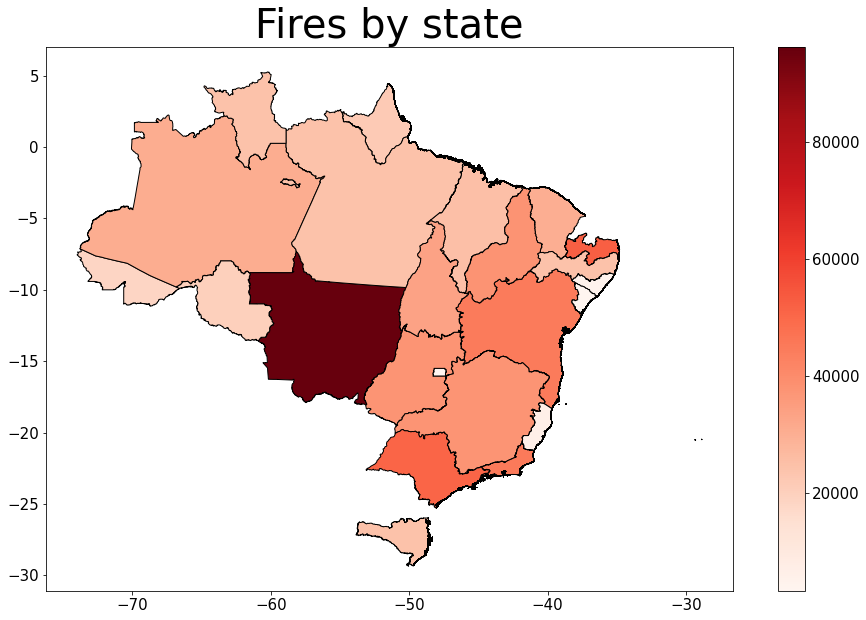

In [16]:
# finally, visualizing fires by state
br_df.plot(column='number',
        cmap='Reds',
        figsize=(16,10),
        legend=True,
        edgecolor='black')

plot = plt.title('Fires by state', fontsize=40)
plt.show()

## The state of Mato Grosso is the state with more fires and the state of Sergipe is the State with less fires among the ones with data available.

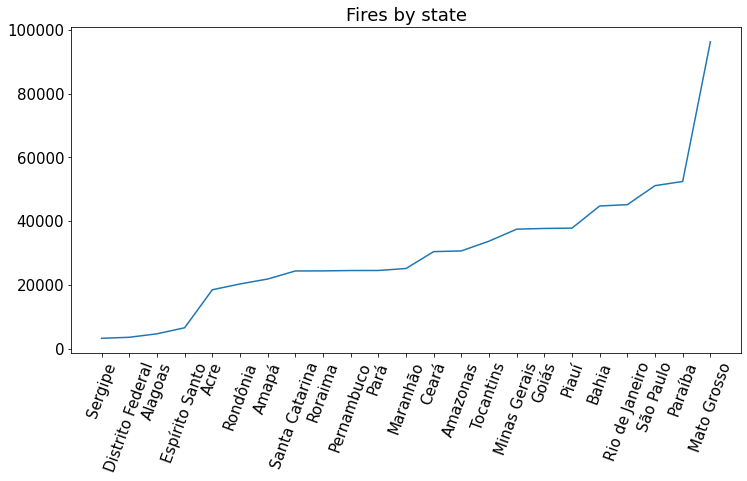

In [17]:
#grouping by state
df_state = df.groupby(by='state').sum().reset_index().sort_values('number')


plt.title('Fires by state')
plt.plot(df_state.state,df_state.number)
plt.xticks(rotation=70)
plt.show()

### Generally, it seems that the number of fires is increasing every year in a somewhat linear way, with 2003 as an outlier, having a lot of fires. 

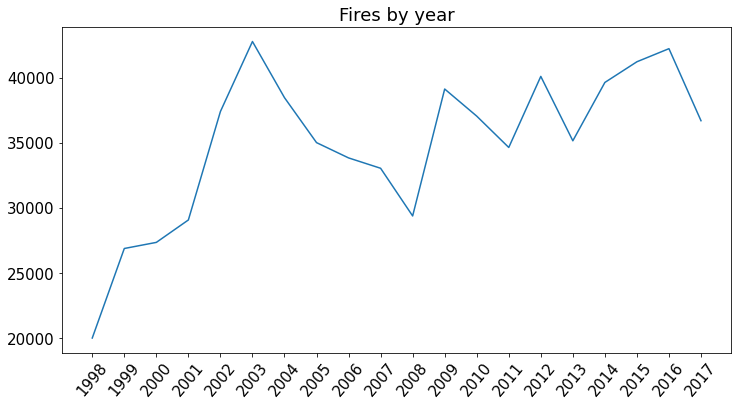

In [18]:
#grouping by year
df_year = df.groupby(by=['year']).sum().reset_index()
years = sorted(np.unique(df['year']))

plt.title('Fires by year')
plt.plot(df_year.year,df_year.number)
plt.xticks(years,rotation=50)
plt.show()

### The months are in Portuguese, here I translate them to English and see the distribution of fires by month. We see a pattern in which the months of July to November have more fires than the rest of the year. However, the pattern is broken in September.

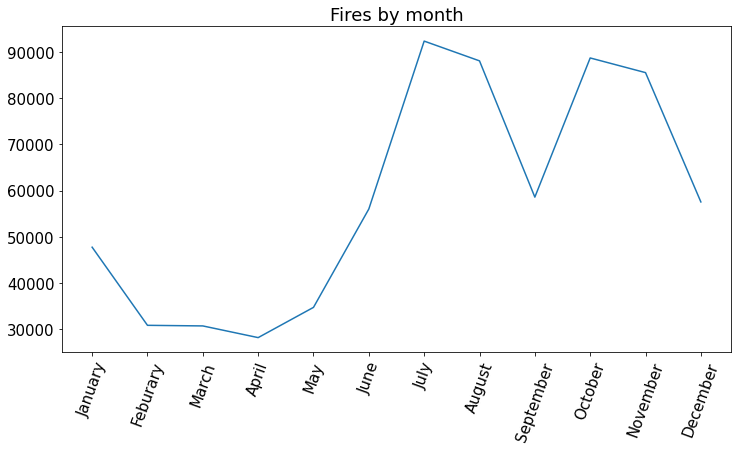

In [19]:
#grouping by month

df_month = df.groupby(by=['month']).sum()
months = ['Janeiro','Fevereiro','Março','Abril',
                                          'Maio','Junho','Julho','Agosto','Setembro',
                                          'Outubro','Novembro','Dezembro']

df_month = df_month.reindex(months).reset_index()
df_month  = df_month.replace({
    'Janeiro': 'January',
    'Fevereiro': 'Feburary',
    'Março': 'March',
    'Abril': 'April',
    'Maio': 'May',
    'Junho': 'June',
    'Julho': 'July',
    'Agosto': 'August',
    'Setembro': 'September',
    'Outubro': 'October',
    'Novembro': 'November',
    'Dezembro': 'December'
})

plt.title('Fires by month')
plt.plot(df_month.month,df_month.number)
plt.xticks(rotation=70)
plt.show()

## 3 - Regression with least squares

### General Regression

- A matrix A containing one column with ones and following columns containing x values is used.
- Then, y is multiplied by A's pseudo-inverse to obtain p, that contains the parameters.

#### <center> $\vec{y} = \ A\,\vec{p}$ </center>
#### <center> $\vec{p} = [(A^TA)^{-1}A^T]\;\vec{y}$ </center>

### Linear Regression (n points)

<br>
<center>
$
\vec{y} = \begin{bmatrix}\ y_1 \\ ... \\ y_{n} \end{bmatrix}\;
\ A = \begin{bmatrix}\ 1 & x_0\\... & ...\\1 & x_n\end{bmatrix}\;
\vec{p} = \begin{bmatrix}\ c \\ m \end{bmatrix}
$
</center>
<br>

### Polynomial Regression (n points, degree k)

<br>
<center>
$\vec{y} = \begin{bmatrix}\  y_1 \\ ... \\ y_{n} \end{bmatrix}\;$ 
$\ A = \begin{bmatrix}\ 1 & x_1 & ... & x_1^k \\... & ... & ... & ... \\1 & x_n & ... & x_n^k \end{bmatrix}\;$ 
$\vec{p} = \begin{bmatrix}\ a_0 \\a_1 \\ ... \\ a_k \end{bmatrix}$  
</center>
<br>

### Surface Regression (n pontos, graus kx e ky)

<br>
<center>
$\vec{y} = \begin{bmatrix}\ z_1 \\ ... \\ z_{n} \end{bmatrix}\;$ 
$\ A = \begin{bmatrix}\ 1 & x_1 & ... & x_1^{kx} & y_1 & ... & y_1^{ky} 
                       \\... & ... & ... & ... & ... & ... & ...
                        \\ 1 & x_n & ... & x_n^{kx} & y_n & ... & y_n^{ky} \end{bmatrix}\;$ 
$\vec{p} = \begin{bmatrix}\ a_0 \\a_1 \\ ... \\ a_{kx} \\ a_{kx+1} \\ ... \\ a_{kx+ky} \end{bmatrix}$  
</center>
<br>

In [20]:
def linear_regression(x,y):
    A = np.column_stack((np.ones(x.shape[0]),x))
    p = np.matmul(np.linalg.pinv(A),y)
    return p
def polynomial_regression(x,y,kx):
    A = np.column_stack((np.ones(x.shape[0]),*[x**i for i in range(1,kx+1)]))
    p = np.matmul(np.linalg.pinv(A),y)
    return p
def surface_regression(x,y,z,kx,ky):
    A = np.column_stack((np.ones(x.shape[0]),*[x**i for i in range(1,kx+1)],*[y**i for i in range(1,ky+1)]))
    p = np.matmul(np.linalg.pinv(A),z)
    return p

### I'll do the following regressions:

#### (i) Year x Number - Linear Regression
#### (ii) Year x Month - Polynomial Regression
#### (iii) Year x Month x Number - Surface Regression

## Linear Regression
### - Parameters: in the upper left corner of the graph

- View the graph in the form of number of fires per year to see the relationship
-  Do the regression using the least squares method

In [21]:
#data grouped by years
year_data = df.groupby(by = ['year']).sum().reset_index()
year_data

,year,number
0,1998,20013.971
1,1999,26882.821
2,2000,27351.251
3,2001,29071.612
4,2002,37390.600
5,2003,42760.674
6,2004,38453.163
7,2005,35004.965
8,2006,33832.161
9,2007,33037.413


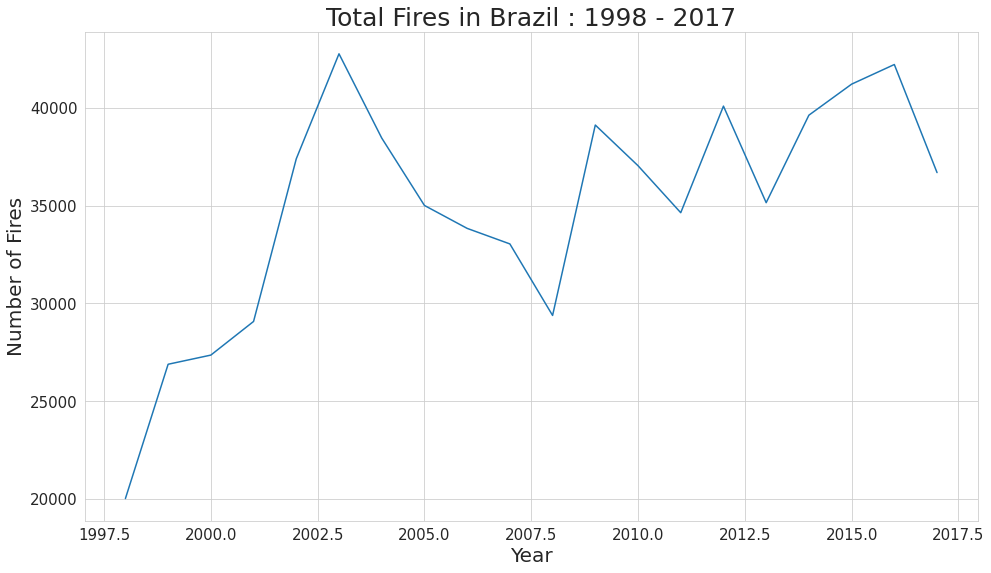

In [22]:
#visualize graph

sns.set_style('whitegrid')

#graphics style
plt.figure(figsize=(16,9))
plt.title('Total Fires in Brazil : 1998 - 2017', fontsize = 25)
plt.xlabel('Year', fontsize = 20)
plt.ylabel('Number of Fires', fontsize = 20)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)

#plot
plt.plot(year_data['year'],year_data['number'])

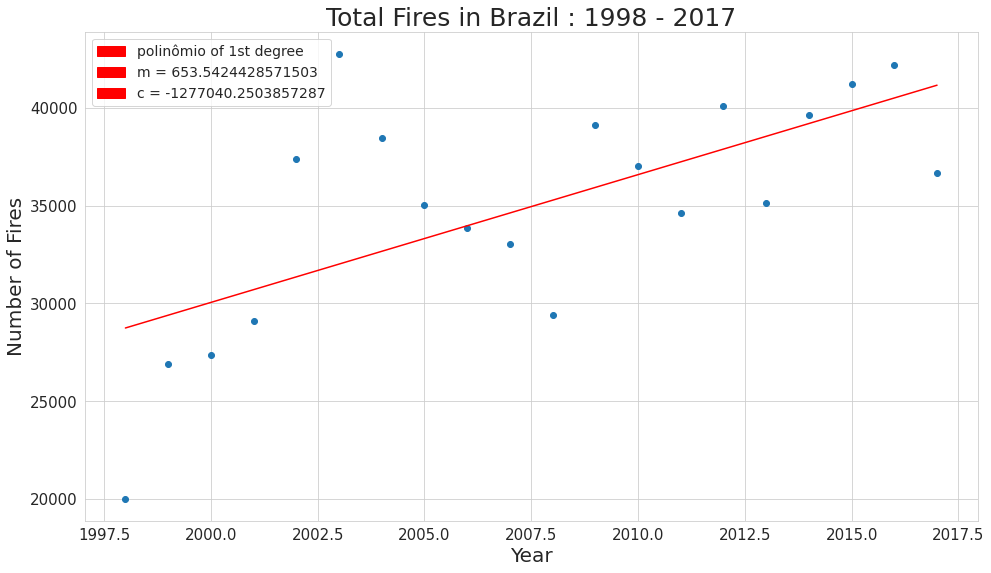

In [23]:
#model

p = linear_regression(year_data['year'],year_data['number'])

#graphics style
plt.figure(figsize=(16,9))
plt.title('Total Fires in Brazil : 1998 - 2017', fontsize = 25)
plt.xlabel('Year', fontsize = 20)
plt.ylabel('Number of Fires', fontsize = 20)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)

#regression plot
x = np.array(year_data['year'])
y = np.zeros(year_data.shape[0])
for i in range(year_data.shape[0]):
    y[i] =  p[1] * x[i] + p[0]

#legends
grau = mpatches.Patch(color='red',label='polinômio of 1st degree')
m = mpatches.Patch(color='red',label='{} = {}'.format('m',p[1]))
c = mpatches.Patch(color='red',label='{} = {}'.format('c',p[0]))
plt.legend(loc='upper left',prop={'size':14},handles=[grau,m,c])
    
#plot
plt.plot(year_data['year'],year_data['number'],'o')
plt.plot(x,y,color='red')
plt.show()

## Polynomial Regression
### - Parameters: as the equation is large, it is shown (rounded) above the graph for better visualization

- View the graph of the number of fires per month (sum of all years) to see the list.
- Performs the polynomial regression with different precision for visualization, since the month of September breaks the pattern and from there it is possible to compare how the regression with high precision shows one pattern and the one with less another. This analysis is interesting to analyze overfitting which can be a problem due to the presence of outliers.


In [24]:
#visualize data

data = df.groupby(by='month').sum().reset_index()
data = data.drop('year',axis=1)

#translate months
data = data.replace({
    'Janeiro': 'January',
    'Fevereiro': 'February',
    'Março': 'March',
    'Abril': 'April',
    'Maio': 'May',
    'Junho': 'June',
    'Julho': 'July',
    'Agosto': 'August',
    'Setembro': 'September',
    'Outubro': 'October',
    'Novembro': 'November',
    'Dezembro': 'December'
})

month_data = data

#loop that gets integer vale of month and puts in the new position
month = {'January':1,'February':2,'March':3,'April':4,'May':5,
         'June':6,'July':7,'August':8,'September':9,
         'October':10,'November':11,'December':12}
new_index = [None for i in range(12)]

for i in range(len(data['month'])):
    new_index[month[data['month'][i]]-1] = i

month_data = month_data.iloc[new_index].reset_index(drop='True')
month_data

,month,number
0,January,47747.844
1,February,30848.050
2,March,30717.405
3,April,28188.770
4,May,34731.363
5,June,56010.675
6,July,92326.113
7,August,88050.435
8,September,58578.305
9,October,88681.579


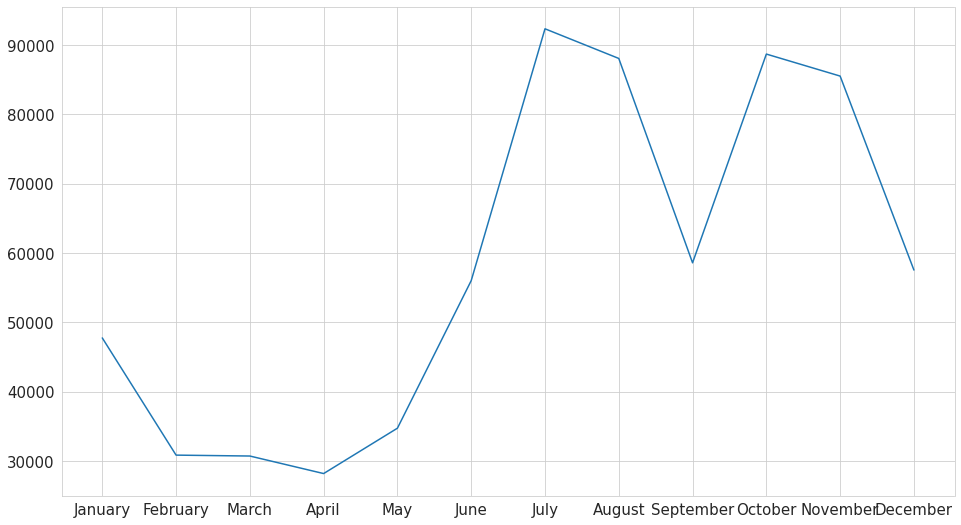

In [25]:
#visualize graphic

plt.figure(figsize=(16,9))
plt.plot(month_data['month'],month_data['number'])

Equation: 49330.92 x0 + -30824.52 x1 + 11710.72 x2 + -1253.99 x3 + 47.04 x4 + 0 x5


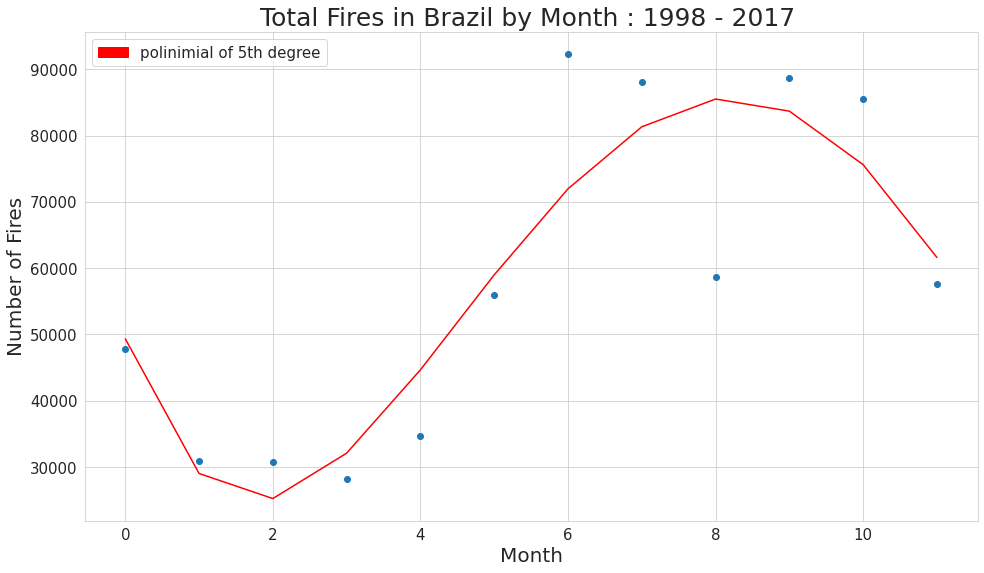

In [26]:

#model with smaller precision

x = np.arange(12)
p = polynomial_regression(x,month_data['number'],5) 
curve = np.poly1d(list(reversed(p)))
y = curve(x)


#graphics style
plt.figure(figsize=(16,9))
plt.title('Total Fires in Brazil by Month : 1998 - 2017 ', fontsize = 25)
plt.xlabel('Month', fontsize = 20)
plt.ylabel('Number of Fires', fontsize = 20)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)

#equation
equation = ''
for i in range(len(curve)):
    equation = ''.join([equation,str(round(curve[i],2)) + ' x' + str(i) + ' + '])
equation = ''.join([equation,str(round(curve[-1],2)) + ' x' + str(len(curve))])
print('Equation: ' + BOLD + equation + END)


#plot
grau = mpatches.Patch(color='red',label='polinimial of 5th degree')
plt.legend(loc='upper left',prop={'size':15},handles=[grau])
plt.plot(x,month_data['number'],'o')
plt.plot(x,y,color='red')
plt.show()

Equation: 47699.44 x0 + 139355.85 x1 + -402637.77 x2 + 394451.53 x3 + -192863.13 x4 + 53084.9 x5 + -8565.16 x6 + 802.01 x7 + -40.3 x8 + 0 x9


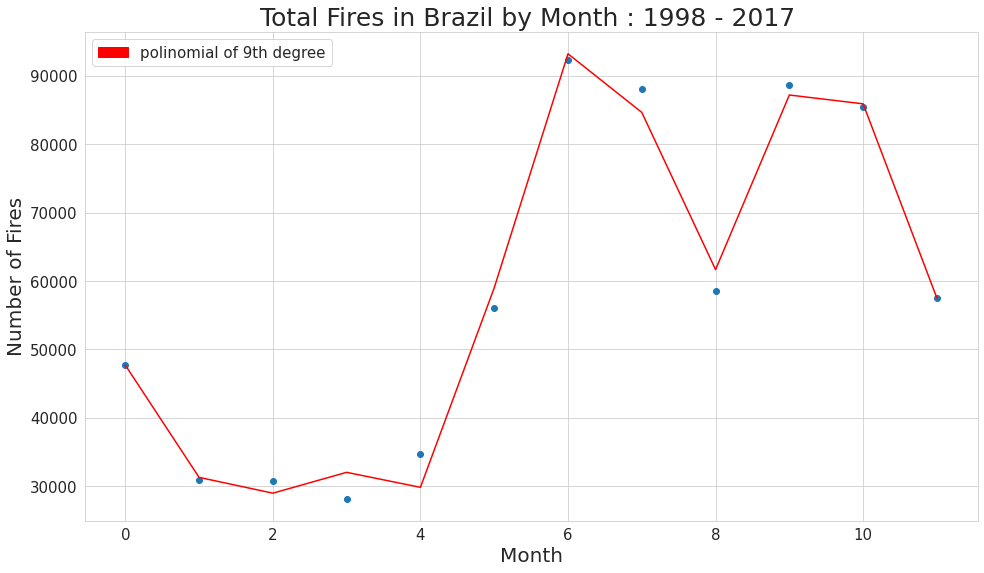

In [27]:
#model with bigger precision

x = np.arange(12)
p = polynomial_regression(x,month_data['number'],9) 
curve = np.poly1d(list(reversed(p)))
y = curve(x)


#graphics style
plt.figure(figsize=(16,9))
plt.title('Total Fires in Brazil by Month : 1998 - 2017 ', fontsize = 25)
plt.xlabel('Month', fontsize = 20)
plt.ylabel('Number of Fires', fontsize = 20)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)

#equation
equation = ''
for i in range(len(curve)):
    equation = ''.join([equation,str(round(curve[i],2)) + ' x' + str(i) + ' + '])
equation = ''.join([equation,str(round(curve[-1],2)) + ' x' + str(len(curve))])
print('Equation: ' + BOLD + equation + END)

#plot
grau = mpatches.Patch(color='red',label='polinomial of 9th degree')
plt.legend(loc='upper left',prop={'size':15},handles=[grau])
plt.plot(np.arange(12),month_data['number'],'o')
plt.plot(x,y,color='red')
plt.show()

### Surface Regression
#### - Parameters: the fit was made with grade 10 and 100 for comparison, so instead of a subtitle I show the vectors containing the parameters obtained for x and y, from grade 0 to grade 10 and 100

- View the graph in the form of fire number (z-axis) depending on the month (y-axis) and year (x-axis) to see the relationship
- It is noted that it was possible to visualize that there is an almost constant growth on the x-axis, since the number of fires per year always grows, on the y-axis there is a variation that occurs during the year, that is, the results of the previous items
- As much as it was possible to visualize the relationship, this polynomial is probably not the best way to model these data, otherwise it could be a function of z as a function of x and y that grows in x and oscillates y for example $ z = ax ^ { n} cos (b + cy) $
- Does regression using the least squares method


In [28]:
#we convert states and months to nominals and organize data
months_dict = {'Janeiro':0,'Fevereiro':1,'Março':2,'Abril':3,'Maio':4,'Junho':5,'Julho':6,'Agosto':7,'Setembro':8,'Outubro':9,'Novembro':10,'Dezembro':11}
sates = np.unique(df['state'])

#convert months to nominals
new_data = df.copy()
for month in months_dict:
    new_data = new_data.replace(month,months_dict[month])
new_data = new_data.sort_values(['year','month'],ascending=[1,1])

#converte states to nominals
new_data['state'] = pd.factorize(new_data.state)[0]

#group data into year and month (strip states)
#shows the beginning and end of the data to check
#note that the 2017 data will only go until the month of November (10)

new_data = new_data.groupby(by=['year','month']).sum().reset_index()
new_data = new_data.drop(['state'],axis=1)
new_data

,year,month,number
0,1998,0,0.000
1,1998,1,0.000
2,1998,2,0.000
3,1998,3,0.000
4,1998,4,0.000
...,...,...,...
234,2017,6,5929.998
235,2017,7,4120.410
236,2017,8,2779.317
237,2017,9,3600.159


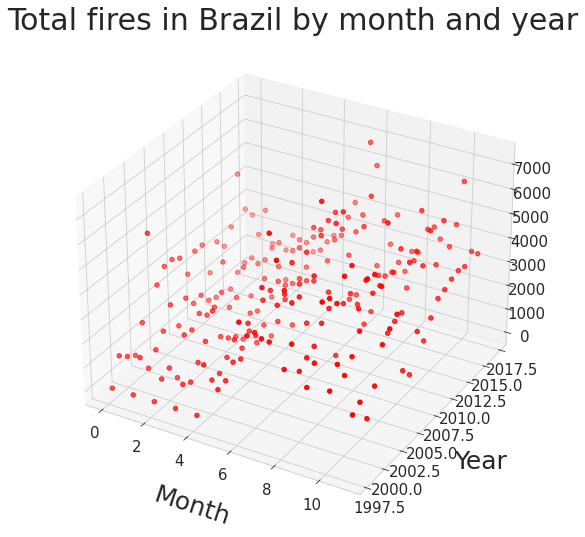

In [29]:
#view of the surface
#x is a year, y is a month and z is a number, use the order of magnitude 6

#view points
fig = plt.figure(figsize=(16,9))
ax = fig.add_subplot(111,projection='3d')
ax.scatter(new_data['month'],new_data['year'],new_data['number'],color='red')
ax.set_xlabel('Month', fontsize = 25,labelpad=20) 
ax.set_ylabel('Year', fontsize = 25,labelpad=20)
plt.title('Total fires in Brazil by month and year',fontsize=30)
plt.show()

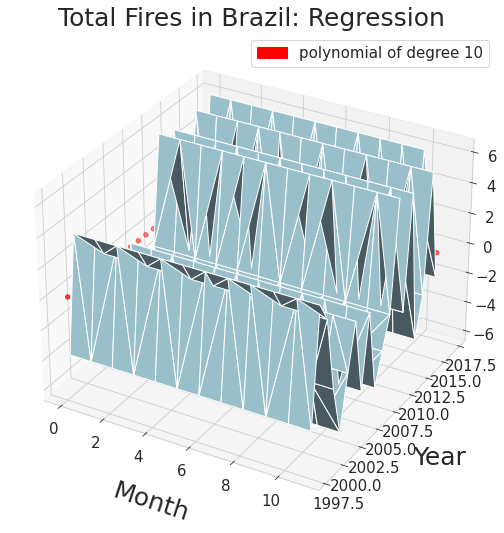

Constant:


-8.383264181168836e-13

X coefficients:


array([-1.54474536e-06, -7.27547163e-06, -8.43557294e-07,  2.70110454e-07,
        1.74339666e-05])

Y coefficients:


array([ 9.77203908e-05,  4.56765226e-04,  1.41242244e-03, -2.67278465e-04,
        1.23127424e-05])

In [30]:
#model
#x is a year, y is a month and z is a number, use the order of magnitude 9
grau = 10
p = surface_regression(new_data['month'],new_data['year'],new_data['number'],grau,grau)

#calculate values from model
z = np.full(new_data.shape[0],np.nan)
for j in range(new_data.shape[0]):
    z[j] = 0
    for i in range(grau+1):
        z[j] += p[i]*(new_data['month'][j]**i) + p[5+i]*(new_data['year'][j]**i)

#show regression results
fig = plt.figure(figsize=(16,9))
ax = fig.add_subplot(111,projection='3d')    
ax.scatter(new_data['month'],new_data['year'],new_data['number'],color='red')
ax.plot_trisurf(new_data['month'],new_data['year'],z,color='lightblue')

ax.set_title('Total Fires in Brazil: Regression', fontsize = 25)
ax.set_xlabel('Month', fontsize = 25,labelpad=20) 
ax.set_ylabel('Year', fontsize = 25,labelpad=20) 
_grau = mpatches.Patch(color='red',label='polynomial of degree '+str(grau))
plt.legend(loc='upper right',prop={'size':15},handles=[_grau])

plt.show()

print(BOLD+'Constant:'+END)
display(p[0])
print(BOLD+'X coefficients:'+END)
display(p[1:int(grau/2)+1])
print(BOLD+'Y coefficients:'+END)
display(p[int(grau/2)+1:grau+1])

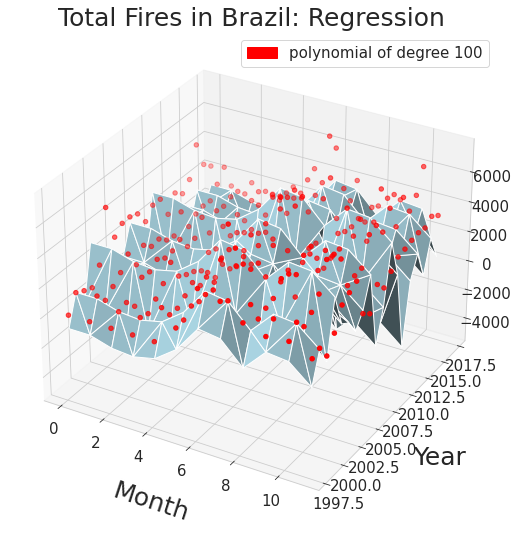

Constant:


1.0137009600006076e-31

X coefficients:


array([ 1.58627358e-31,  5.87788648e-32, -1.91603946e-31,  2.17440417e-31,
        7.35156464e-31,  7.41894058e-30,  6.57766901e-29,  6.03689494e-28,
        5.62940175e-27,  5.32512786e-26,  5.10580522e-25,  4.95744307e-24,
        4.86925761e-23,  4.83303414e-22,  4.84260590e-21,  4.89344958e-20,
        4.98237469e-19,  5.10728740e-18, -1.29428202e-17,  2.37744286e-17,
       -1.01739360e-16,  1.69202182e-17,  2.19392075e-17,  2.43236505e-17,
       -1.07431426e-17,  9.11677615e-18, -2.31500223e-18,  5.93808311e-18,
        5.15148799e-17,  2.05281713e-17, -5.79545375e-17, -1.09599421e-17,
        3.29150843e-17,  1.53812994e-17,  8.58397208e-19, -2.58562971e-17,
        1.67799294e-17, -7.60615487e-18,  1.48321653e-17,  3.19247580e-18,
       -1.04442013e-18,  2.28167882e-17,  3.34882464e-17, -1.40220576e-17,
        1.89726072e-18,  1.74518927e-17,  6.85123082e-18,  1.93000571e-17,
        9.84659413e-18, -4.50844619e-17])

Y coefficients:


array([ 8.90777619e-18, -4.98622093e-18, -2.91081075e-17, -1.83568440e-17,
       -1.82257958e-17,  9.57826963e-18,  3.28057149e-17, -1.66545677e-17,
       -9.43295159e-18,  1.11886914e-17, -2.24179603e-19, -2.63328663e-17,
        3.40289394e-17, -1.12551322e-17, -1.40873996e-17, -1.20693342e-17,
        4.35311701e-18,  5.93035219e-18,  3.44059327e-19,  1.43226681e-17,
        5.84385991e-18, -1.16441399e-17,  1.63536343e-17,  1.00216237e-17,
        9.41782242e-19, -6.33482165e-18,  6.37728504e-18,  9.90101232e-18,
       -1.82964263e-18,  1.16974067e-17,  1.73586075e-17,  1.25818535e-17,
        8.38577466e-18, -2.00903568e-18,  5.12697005e-18, -1.34339794e-17,
       -6.15639700e-18,  2.72907665e-18,  1.19916984e-17, -1.46579621e-17,
        1.42253193e-17,  1.61175770e-17,  2.43496285e-18, -5.08970355e-18,
       -4.61058071e-18,  8.33049539e-18,  1.61868421e-17,  1.27543577e-17,
       -3.63954914e-18,  9.37330279e-18])

In [31]:
#model
#x is a year, y is a month and z is a number, use the order of magnitude 100
grau = 100
p = surface_regression(new_data['month'],new_data['year'],new_data['number'],grau,grau)

#calculate values from model
z = np.full(new_data.shape[0],np.nan)
for j in range(new_data.shape[0]):
    z[j] = 0
    for i in range(grau+1):
        z[j] += p[i]*(new_data['month'][j]**i) + p[50+i]*(new_data['year'][j]**i)

#show regression results
fig = plt.figure(figsize=(16,9))
ax = fig.add_subplot(111,projection='3d')    
ax.scatter(new_data['month'],new_data['year'],new_data['number'],color='red')
ax.plot_trisurf(new_data['month'],new_data['year'],z,color='lightblue')

ax.set_title('Total Fires in Brazil: Regression', fontsize = 25)
ax.set_xlabel('Month', fontsize = 25,labelpad=20) 
ax.set_ylabel('Year', fontsize = 25,labelpad=20) 
_grau = mpatches.Patch(color='red',label='polynomial of degree '+str(grau))
plt.legend(loc='upper right',prop={'size':15},handles=[_grau])

plt.show()

print(BOLD+'Constant:'+END)
display(p[0])
print(BOLD+'X coefficients:'+END)
display(p[1:int(grau/2)+1])
print(BOLD+'Y coefficients:'+END)
display(p[int(grau/2)+1:grau+1])